In [1]:
import pandas as pd
import os
import json
import openai
import backoff
from PIL import Image

In [2]:
file_path = os.path.join("data", "pubmed_set", "captions.json")

with open(file_path, 'rb') as file:
    captions = json.load(file)

In [3]:
OPENAI_API_PATH = os.path.join(os.getcwd(), 'api.key')

with open(OPENAI_API_PATH) as f:
    openai.api_key = f.read().strip()

@backoff.on_exception(backoff.expo, openai.OpenAIError)
def completions_with_backoff(**kwargs):
    return openai.chat.completions.create(**kwargs)

def gpt(user_prompt, system_prompt="You are an expert radiologist", model="gpt-4", temperature=0.7, max_tokens=1000) -> list:

    messages = [{"role": "system", "content": system_prompt},
                {"role": "user", "content": user_prompt}]
    
    res = completions_with_backoff(model=model, messages=messages, temperature=temperature, max_tokens=max_tokens)
    
    return res.choices[0].message.content

In [4]:
base_prompt = '''You are given a caption of a radiology image. Your job is to generate a total of 5 open-ended question/answer pairs from this image caption starting with "What" or "Where".
The question/answer pairs should be derived from the image caption in a sense that any radiologist should be able to answer the question if the question is presented along with the accompanying image.

Caption: {caption}
Question:
Answer:
'''

Caption:  ER expression in tumor tissue. IHC staining, original 

Question: What does ER expression in tumor tissue imply?
Answer: ER expression in tumor tissue often indicates that the tumor may be responsive to hormonal therapies, as it shows the presence of estrogen receptors.

Question: What is the significance of IHC staining in this context?
Answer: IHC staining is used to visualize the ER expression in the tumor tissue. It can help in identifying the presence and location of specific proteins, such as estrogen receptors, in the tissue sample.

Question: What can be inferred from the 'original' label in the image caption?
Answer: The term 'original' suggests that the image provided is not a modified or enhanced version. It is the initial version of the image obtained from the staining process.

Question: What is the role of estrogen receptors in tumor progression?
Answer: Estrogen receptors, when activated by estrogen, can stimulate the growth of certain types of cancer cells, pa

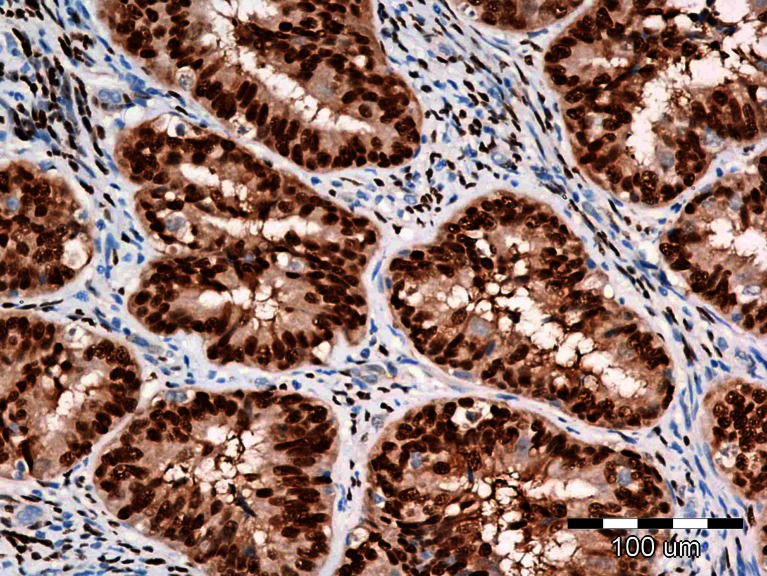

In [8]:
id = 0
caption = captions[str(id)]['caption']
uuid = captions[str(id)]['uuid']
img_path = os.path.join("data", "pubmed_set", "images", uuid + ".jpg")
img = Image.open(img_path)

user_prompt = base_prompt.format(caption = caption)
res = gpt(user_prompt)
print("Caption: ", caption, "\n")
print(res)
img

Caption:  Nuclear expression of TS (brown) in a colon carcinoma 

Question: What does the TS stand for in the context of a colon carcinoma?
Answer: TS stands for Thymidylate Synthase, an enzyme involved in DNA synthesis and repair.

Question: What is the significance of the nuclear expression of TS in colon carcinoma?
Answer: The nuclear expression of TS in colon carcinoma indicates that the cancer cells are actively proliferating and synthesizing DNA, which can be indicative of an aggressive tumor.

Question: What does the brown color represent in the image of the colon carcinoma?
Answer: The brown color represents the presence of TS. In immunohistochemistry, a brown stain is often used to mark the presence of the protein of interest, in this case, TS.

Question: Where in the image would you expect to see the nuclear expression of TS in colon carcinoma?
Answer: You would expect to see the nuclear expression of TS within the nuclei of the cancer cells in the image, appearing as brown s

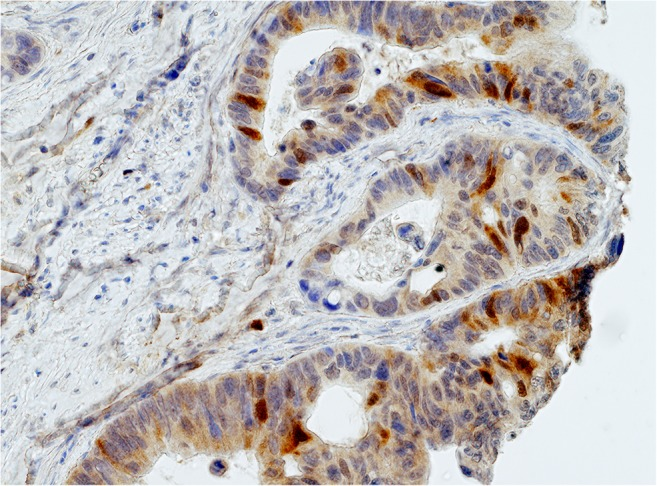

In [9]:
id = 1
caption = captions[str(id)]['caption']
uuid = captions[str(id)]['uuid']
img_path = os.path.join("data", "pubmed_set", "images", uuid + ".jpg")
img = Image.open(img_path)

user_prompt = base_prompt.format(caption = caption)
res = gpt(user_prompt)
print("Caption: ", caption, "\n")
print(res)
img

Caption:  Nuclear expression of E2F1 (brown) in a colon carcinoma. This is higher magnification of the upper portion of a core shown in an inset (lower left corner) 

Question: What is the significance of the nuclear expression of E2F1 in this colon carcinoma image?
Answer: The nuclear expression of E2F1 is significant as it plays a crucial role in cell cycle regulation and proliferation, often found to be overexpressed in various types of cancers including colon carcinoma.

Question: What color indicates the nuclear expression of E2F1 in this image?
Answer: The nuclear expression of E2F1 is indicated by brown color in this image.

Question: Where in the image is the nuclear expression of E2F1 most concentrated?
Answer: The nuclear expression of E2F1 is most concentrated in the upper portion of a core shown in the image.

Question: What does the inset in the lower left corner show in this radiology image?
Answer: The inset in the lower left corner shows a higher magnification of the up

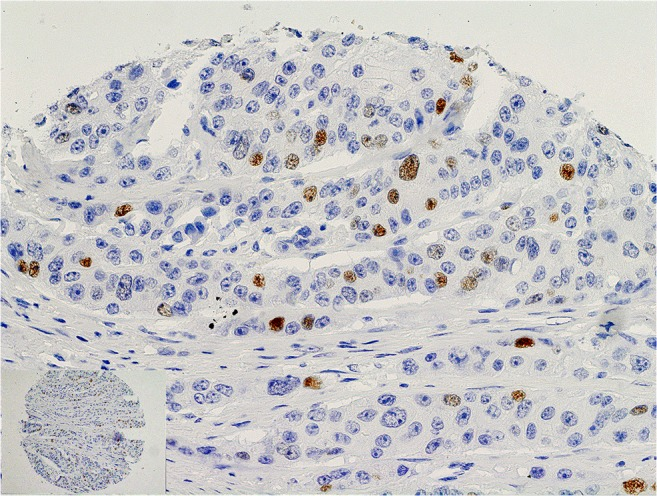

In [10]:
id = 2
caption = captions[str(id)]['caption']
uuid = captions[str(id)]['uuid']
img_path = os.path.join("data", "pubmed_set", "images", uuid + ".jpg")
img = Image.open(img_path)

user_prompt = base_prompt.format(caption = caption)
res = gpt(user_prompt)
print("Caption: ", caption, "\n")
print(res)
img

Caption:  Cytoplasmic immunoexpression of PD-L1 in oral squamous cell carcinomas with poorer prognosis (OSCCPP). Immunohistochemistry. Total magnification x100 

Question: What type of carcinoma is the focus of this image?
Answer: The focus of this image is oral squamous cell carcinoma with poorer prognosis (OSCCPP).

Question: What is the method used to visualize the cytoplasmic immunoexpression of PD-L1 in this image?
Answer: Immunohistochemistry is the method used to visualize the cytoplasmic immunoexpression of PD-L1 in this image. 

Question: What is the total magnification used in this image of the oral squamous cell carcinoma?
Answer: The total magnification used in this image is x100.

Question: What is the significance of PD-L1 immunoexpression observed in this image?
Answer: PD-L1 immunoexpression is often associated with poorer prognosis in oral squamous cell carcinomas, indicating an advanced stage of the disease and potentially less favorable response to treatment.

Questi

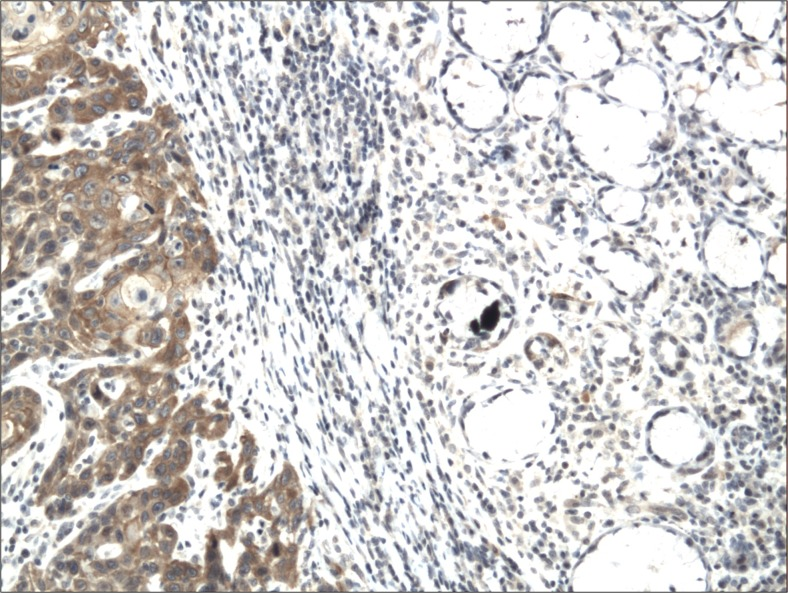

In [11]:
id = 3
caption = captions[str(id)]['caption']
uuid = captions[str(id)]['uuid']
img_path = os.path.join("data", "pubmed_set", "images", uuid + ".jpg")
img = Image.open(img_path)

user_prompt = base_prompt.format(caption = caption)
res = gpt(user_prompt)
print("Caption: ", caption, "\n")
print(res)
img

Caption:  Nuclear and perinuclear immunoexpression of Foxp3 in oral squamous cell carcinomas with poorer prognosis (OSCCPP). Immunohistochemistry. Total magnification x100 

Question: What is the significance of nuclear and perinuclear immunoexpression of Foxp3 in oral squamous cell carcinomas?
Answer: The immunoexpression of Foxp3 in the nuclear and perinuclear regions is often associated with a poorer prognosis in oral squamous cell carcinomas. Foxp3 is a transcription factor that plays a crucial role in the immune system's response to cancer. Its overexpression can indicate a more aggressive form of the disease.

Question: Where in the cell is the Foxp3 immunoexpression observed in oral squamous cell carcinomas?
Answer: The Foxp3 immunoexpression is observed in the nuclear and perinuclear regions of the cells in oral squamous cell carcinomas.

Question: What is the magnification used in the immunohistochemistry image of oral squamous cell carcinomas with Foxp3 immunoexpression?
Answ

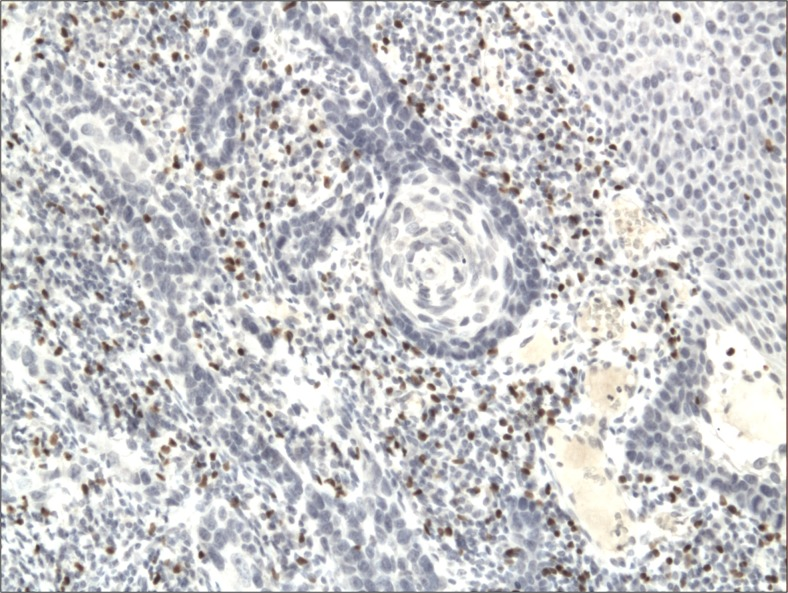

In [12]:
id = 4
caption = captions[str(id)]['caption']
uuid = captions[str(id)]['uuid']
img_path = os.path.join("data", "pubmed_set", "images", uuid + ".jpg")
img = Image.open(img_path)

user_prompt = base_prompt.format(caption = caption)
res = gpt(user_prompt)
print("Caption: ", caption, "\n")
print(res)
img

Caption:  Cytoplasmic immunoexpression of PD-L1 in oral squamous cell carcinomas with better prognosis (OSCCBP). Immunohistochemistry. Total magnification x100 

Question: What is the significance of the cytoplasmic immunoexpression of PD-L1 in oral squamous cell carcinomas?
Answer: The cytoplasmic immunoexpression of PD-L1 in oral squamous cell carcinomas is associated with a better prognosis.

Question: Where is the PD-L1 expression located in oral squamous cell carcinomas with better prognosis (OSCCBP)?
Answer: The PD-L1 expression is located in the cytoplasm of the cells in oral squamous cell carcinomas with better prognosis (OSCCBP).

Question: What method was used to visualize the cytoplasmic immunoexpression of PD-L1 in oral squamous cell carcinomas?
Answer: Immunohistochemistry was used to visualize the cytoplasmic immunoexpression of PD-L1 in oral squamous cell carcinomas.

Question: What is the magnification used in the image for visualizing the PD-L1 in oral squamous cell ca

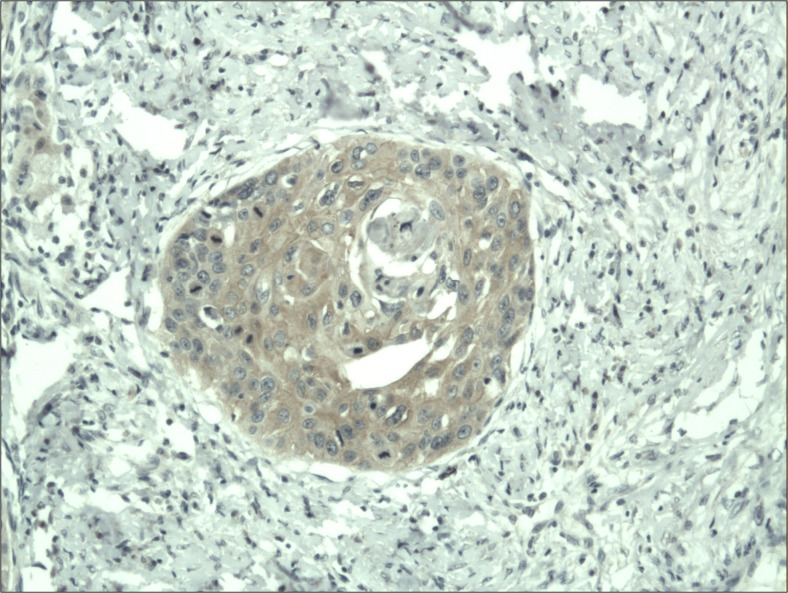

In [13]:
id = 5
caption = captions[str(id)]['caption']
uuid = captions[str(id)]['uuid']
img_path = os.path.join("data", "pubmed_set", "images", uuid + ".jpg")
img = Image.open(img_path)

user_prompt = base_prompt.format(caption = caption)
res = gpt(user_prompt)
print("Caption: ", caption, "\n")
print(res)
img

Caption:  Nuclear and perinuclear immunoexpression of Foxp3 in oral squamous cell carcinomas with better prognosis (OSCCBP). Immunohistochemistry. Total magnification x100 

Question: What does the nuclear and perinuclear immunoexpression of Foxp3 indicate in OSCCBP?
Answer: It indicates the presence and severity of oral squamous cell carcinomas with better prognosis.

Question: Where is the Foxp3 immunoexpression typically located in oral squamous cell carcinomas?
Answer: The Foxp3 immunoexpression is typically located in the nuclear and perinuclear areas.

Question: What is the significance of Foxp3 in oral squamous cell carcinomas with better prognosis (OSCCBP)?
Answer: Foxp3 is a crucial biomarker in OSCCBP, often indicating a better prognosis due to its role in immune response regulation.

Question: What is the total magnification used in the Immunohistochemistry of this image?
Answer: The total magnification used in this image is x100.

Question: Where can you observe the immunoe

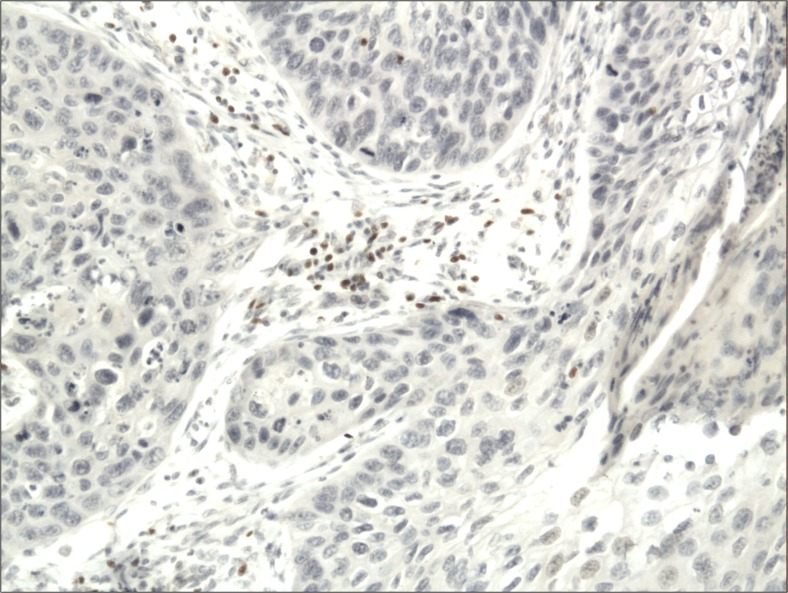

In [14]:
id = 6
caption = captions[str(id)]['caption']
uuid = captions[str(id)]['uuid']
img_path = os.path.join("data", "pubmed_set", "images", uuid + ".jpg")
img = Image.open(img_path)

user_prompt = base_prompt.format(caption = caption)
res = gpt(user_prompt)
print("Caption: ", caption, "\n")
print(res)
img

Caption:  Cytoplasmic immunoexpression of PD-L1 in control. Immunohistochemistry. Total magnification x100 

Question: What is the process used to visualize the cytoplasmic immunoexpression of PD-L1 in this image?
Answer: The process used in this image is Immunohistochemistry.

Question: What is the total magnification used to observe the cytoplasmic immunoexpression of PD-L1 in this image?
Answer: The total magnification used to observe the image is x100.

Question: Where is the PD-L1 expression located in the cells shown in this image?
Answer: The PD-L1 expression is located in the cytoplasm of the cells in this image.

Question: What is the significance of PD-L1 immunoexpression in the control?
Answer: The significance of PD-L1 immunoexpression in the control is to provide a baseline for comparison with other samples or conditions.

Question: What does the cytoplasmic immunoexpression of PD-L1 in control indicate?
Answer: The cytoplasmic immunoexpression of PD-L1 in control indicate

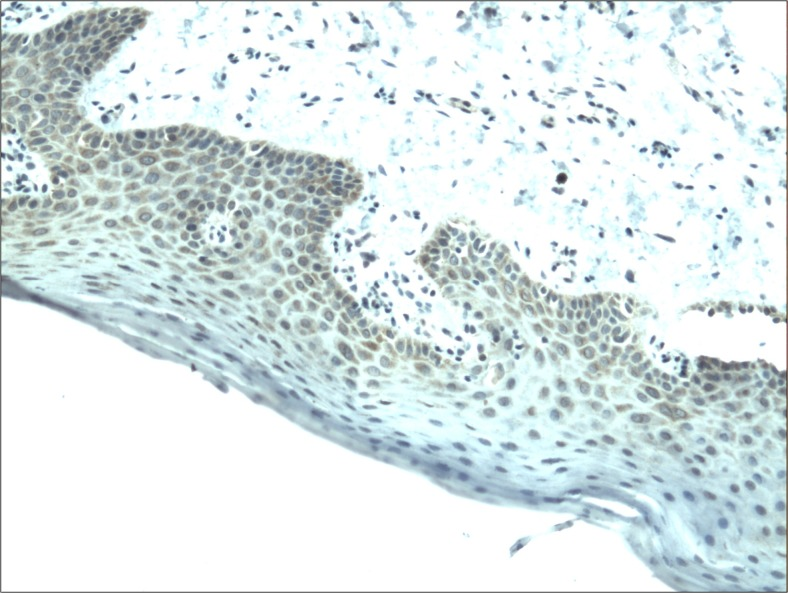

In [15]:
id = 7
caption = captions[str(id)]['caption']
uuid = captions[str(id)]['uuid']
img_path = os.path.join("data", "pubmed_set", "images", uuid + ".jpg")
img = Image.open(img_path)

user_prompt = base_prompt.format(caption = caption)
res = gpt(user_prompt)
print("Caption: ", caption, "\n")
print(res)
img

Caption:  Nuclear and perinuclear immunoexpression of Foxp3 in control. Immunohistochemistry. Total magnification x100 

Question: What is the significance of Foxp3 immunoexpression in this radiology image?
Answer: Foxp3 immunoexpression is significant because it is a crucial marker for regulatory T-cells which are essential for maintaining immune system balance and preventing autoimmunity.

Question: What type of procedure was used to visualize the Foxp3 immunoexpression?
Answer: The procedure used to visualize the Foxp3 immunoexpression was Immunohistochemistry.

Question: Where in the cell can we see the immunoexpression of Foxp3 in this image?
Answer: In this image, the immunoexpression of Foxp3 can be seen in the nuclear and perinuclear regions of the cell.

Question: What is the total magnification used in this radiology image?
Answer: The total magnification used in this radiology image is x100.

Question: Where is the Foxp3 protein usually found in cells?
Answer: The Foxp3 prot

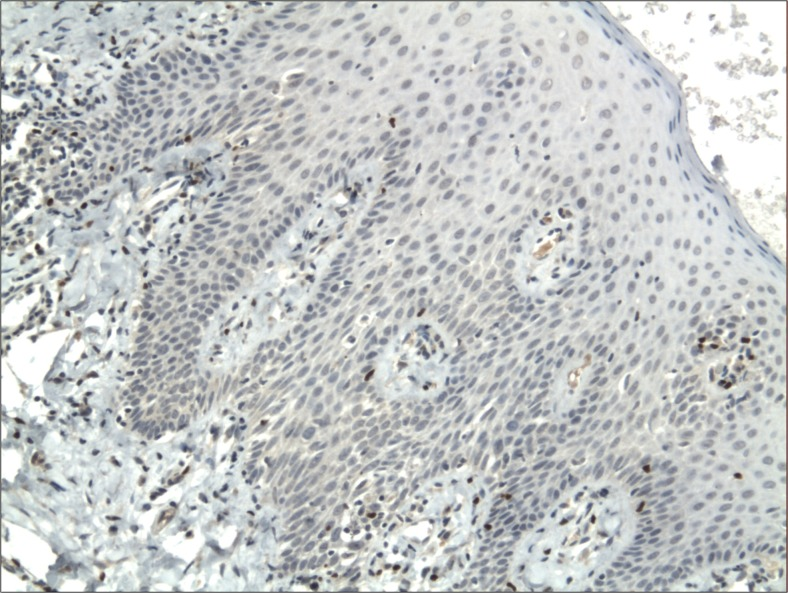

In [16]:
id = 8
caption = captions[str(id)]['caption']
uuid = captions[str(id)]['uuid']
img_path = os.path.join("data", "pubmed_set", "images", uuid + ".jpg")
img = Image.open(img_path)

user_prompt = base_prompt.format(caption = caption)
res = gpt(user_prompt)
print("Caption: ", caption, "\n")
print(res)
img

Caption:  Membranous immunoexpression of CD4 in oral squamous cell carcinomas with poorer prognosis (OSCCPP). Immunohistochemistry. Total magnification x100 

Question: What is the significance of membranous immunoexpression of CD4 in oral squamous cell carcinomas?
Answer: The membranous immunoexpression of CD4 in oral squamous cell carcinomas is significant as it is associated with a poorer prognosis. 

Question: Where exactly can the immunoexpression of CD4 be typically located in oral squamous cell carcinomas?
Answer: The immunoexpression of CD4 can typically be found on the cell membranes of the cancer cells in oral squamous cell carcinomas.

Question: What does the term 'Immunohistochemistry' refer to in the context of the image caption?
Answer: In this context, 'Immunohistochemistry' refers to the technique used to visualize the immunoexpression of CD4 in oral squamous cell carcinomas.

Question: What does the 'total magnification x100' mean in the context of the image?
Answer: T

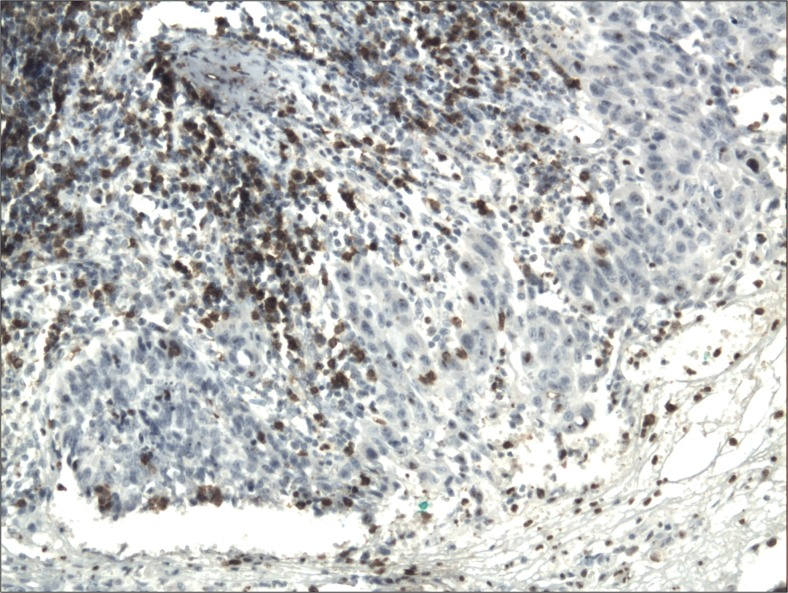

In [17]:
id = 9
caption = captions[str(id)]['caption']
uuid = captions[str(id)]['uuid']
img_path = os.path.join("data", "pubmed_set", "images", uuid + ".jpg")
img = Image.open(img_path)

user_prompt = base_prompt.format(caption = caption)
res = gpt(user_prompt)
print("Caption: ", caption, "\n")
print(res)
img

Caption:  Membranous immunoexpression of CD4 in oral squamous cell carcinomas with better prognosis (OSCCBP). Immunohistochemistry. Total magnification x100 

Question: What does the membranous immunoexpression of CD4 indicate in oral squamous cell carcinomas (OSCCBP)?
Answer: The membranous immunoexpression of CD4 in OSCCBP generally indicates a better prognosis.

Question: Where can you typically observe the membranous immunoexpression of CD4 in oral squamous cell carcinomas with better prognosis (OSCCBP)?
Answer: The membranous immunoexpression of CD4 can be typically observed in the cytoplasmic membrane of the squamous cells in OSCCBP.

Question: What technique is used to observe the membranous immunoexpression of CD4 in oral squamous cell carcinomas with better prognosis (OSCCBP)?
Answer: Immunohistochemistry is the technique used to observe the membranous immunoexpression of CD4 in OSCCBP.

Question: What is the total magnification used to observe the membranous immunoexpression 

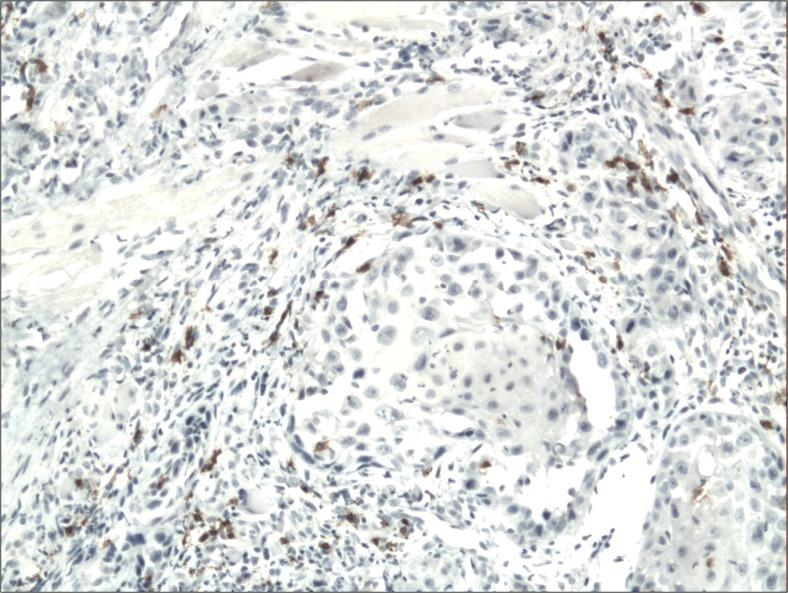

In [18]:
id = 10
caption = captions[str(id)]['caption']
uuid = captions[str(id)]['uuid']
img_path = os.path.join("data", "pubmed_set", "images", uuid + ".jpg")
img = Image.open(img_path)

user_prompt = base_prompt.format(caption = caption)
res = gpt(user_prompt)
print("Caption: ", caption, "\n")
print(res)
img